In [1]:
# Load the libraries
import spatialdata as sd
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
from easydecon.easydecon import *
from easydecon.config import *
from spatialdata_plot.pl.utils import set_zero_in_cmap_to_transparent
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

from easydecon.segmentation import run_bin2cell_segmentation

from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib.patches as patches


pd.set_option('display.max_rows', 10)

/Users/sium/miniconda/envs/easydecon_clean/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/sium/miniconda/envs/easydecon_clean/lib/python3.10/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/sium/miniconda/envs/easydecon_clean/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/us

In [12]:
%reload_ext autoreload
%autoreload 2
from easydecon.easydecon import *
from easydecon.config import *
test_function()

Easydecon loaded!
Test function executed!


In [3]:
set_n_jobs(5) #if you have more than 5 cores, you can increase this number


In [3]:
# load a compatible color map for the spatial data
new_cmap = set_zero_in_cmap_to_transparent(cmap="viridis")

anndata.py (1756): Variable names are not unique. To make them unique, call `.var_names_make_unique`.
anndata.py (1756): Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Found model '2D_versatile_he' for 'StarDist2D'.
Metal device set to: Apple M1 Max

systemMemory: 64.00 GB
maxCacheSize: 24.00 GB



2025-10-07 09:53:22.888815: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-10-07 09:53:22.889017: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.
effective: block_size=(4096, 4096, 3), min_overlap=(128, 128, 0), context=(128, 128, 0)


2025-10-07 09:53:23.266448: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2025-10-07 09:53:23.360489: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
100%|██████████| 16/16 [04:12<00:00, 15.78s/it]


Found 282315 objects
Outputs saved:
  HE TIFF: stardist/sampleP5.he.tiff
  Labels NPZ: stardist/sampleP5.he.npz
  PDF plot: sampleP5_bincounts.pdf
  H5AD: sampleP5_bin2cell.h5ad


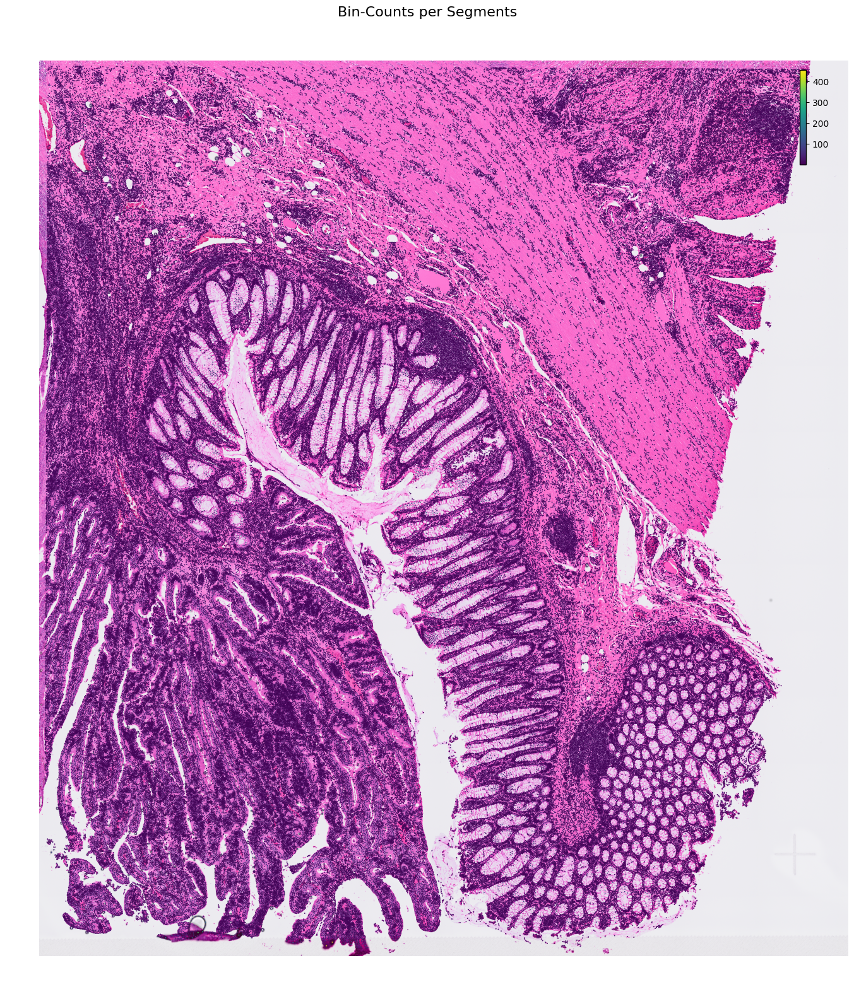

In [ ]:
sample_id="sampleP5"

#adjust directories based on your own dataset, both GPU and CPU should work for segmentation. Apple Silicon is also compatible with the correct version.
cdata=run_bin2cell_segmentation(sample_id=sample_id,binned_002="../../sampleP5/binned_outputs/square_002um",
                                full_image="../../sampleP5/binned_outputs/Visium_HD_Human_Colon_Cancer_P5_tissue_image.btf",
                                spaceranger_image_path="../../sampleP5/binned_outputs/square_002um/spatial/",
                                device="cpu", #you may select GPU if available but CPU should be enough,
                                prob_thresh=0.01, #decrease to detect more cells, can take more time
                                min_cells=0, #this is initial filtering, you may increase
                                min_counts=0
                                )


In [5]:
#some QC
cdata
mt_genes = cdata.var_names.str.startswith('MT-')
cdata = cdata[:, ~mt_genes]
sc.pp.filter_genes(cdata, min_cells=10)
sc.pp.filter_cells(cdata, min_counts=10)
cdata.raw = cdata.copy()
# Normalize and log transform
sc.pp.normalize_total(cdata, inplace=True, target_sum=1e4)
sc.pp.log1p(cdata)

_simple.py (293): Trying to modify attribute `.var` of view, initializing view as actual.


In [ ]:
mask = ((cdata.obs['array_row'] >= 1400) & 
        (cdata.obs['array_row'] <= 1900) & 
        (cdata.obs['array_col'] >= 500) & 
        (cdata.obs['array_col'] <= 1000)
       )
bdata = cdata[mask]

In [19]:
markers_df_top60lf=read_markers_dataframe(cdata,filename="/Users/sium/projects/visiumhd/samplep2_nomito_wilcox.csv",top_n_genes=60,sort_by_column="scores")


Unique cell types detected in the dataframe:
['Cluster 1-CancerCells' 'Cluster 3-fibrosis' 'Cluster 5-Healthy_epi'
 'Cluster 8-muscle' 'Cluster 10 - PCs' 'Cluster 7-Mac' 'Cluster 9 -endot'
 'Cluster 4 - cancer_prolif' 'Cluster 6 - Cancer cell_stem'
 'Cluster 13-Mature colonocytes' 'Cluster 11-Neutrophils' 'Cluster 12-Mac'
 'Cluster 14-Neutrophils' 'Cluster 15-Dead_neutros'
 'Cluster 2-RBCs_soup_neutros']


In [21]:
df_cluster_proportions_nnls=get_proportions_on_tissue(bdata,markers_df=markers_df_top60lf,method="nnls",normalization_method="unit")

common_group_name not found, processing all spots.
Running deconvolution with parallel processing...
Normalization method: unit
Number of threads used: 5
Running deconvolution with method='nnls', alpha=0.1...


100%|██████████| 9167/9167 [00:01<00:00, 6482.98it/s]


Adding results to table.obs of sdata object
Deconvolution completed.


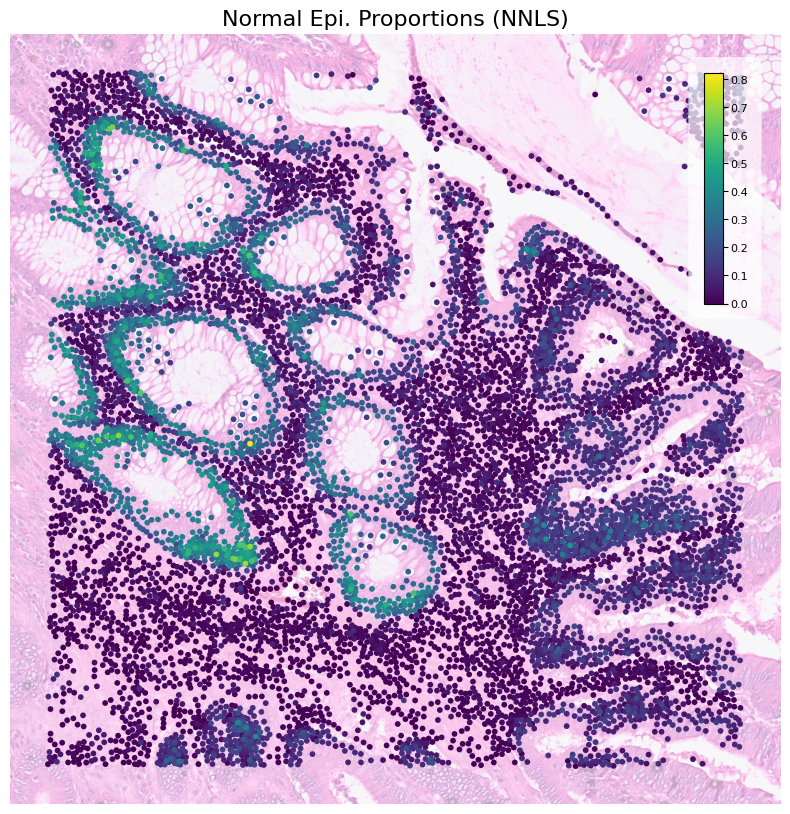

In [22]:
fig, ax = plt.subplots(figsize=(10, 10))  # Adjust figure size as needed

sc.pl.spatial(bdata, color=["Cluster 5-Healthy_epi"
                            ], img_key="0.5_mpp", basis="spatial_cropped",ax=ax,show=False,na_in_legend=False,colorbar_loc=None,alpha_img=0.4)


ax.set_title('Normal Epi. Proportions (NNLS)', fontsize=16)
scatter_plot = ax.collections[0]

# Explicitly define the position of the colorbar in axes coordinates
cbar_bbox = (0.90, 0.65, 0.025, 0.3)  # (x0, y0, width, height)

# Add a white rectangle behind the colorbar (manual background)
bg_rect = patches.FancyBboxPatch(
    (cbar_bbox[0] - 0.01, cbar_bbox[1] - 0.01),  # slight padding
    cbar_bbox[2] + 0.05,
    cbar_bbox[3] + 0.02,
    transform=ax.transAxes,
    boxstyle="round,pad=0.01",
    linewidth=0,
    facecolor=[1, 1, 1, 0.7],
    zorder=2
)
ax.add_patch(bg_rect)

# Add colorbar explicitly
cax = inset_axes(
    ax,
    width="100%",
    height="100%",
    bbox_to_anchor=cbar_bbox,
    bbox_transform=ax.transAxes,
    loc='lower left',
    borderpad=0
)

cbar = plt.colorbar(scatter_plot, cax=cax)

# Force ticks inside
cbar.ax.tick_params(labelcolor='black', pad=2,labelsize=8)


ax.axis('off')

plt.savefig(f"{sample_id}_healty_epi_proportions_nnls.pdf", dpi=300)
plt.show()

In [29]:
df_cluster_proportions_ridge=get_proportions_on_tissue(bdata,markers_df=markers_df_top60lf,method="ridge",normalization_method="unit",alpha=0.1)

common_group_name not found, processing all spots.
Running deconvolution with parallel processing...
Normalization method: unit
Number of threads used: 5
Running deconvolution with method='ridge', alpha=0.1...


  0%|          | 5/9167 [00:00<15:41,  9.73it/s]/Users/sium/miniconda/envs/easydecon_clean/lib/python3.10/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/sium/miniconda/envs/easydecon_clean/lib/python3.10/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/sium/miniconda/envs/easydecon_clean/lib/python3.10/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is d

Adding results to table.obs of sdata object
Deconvolution completed.


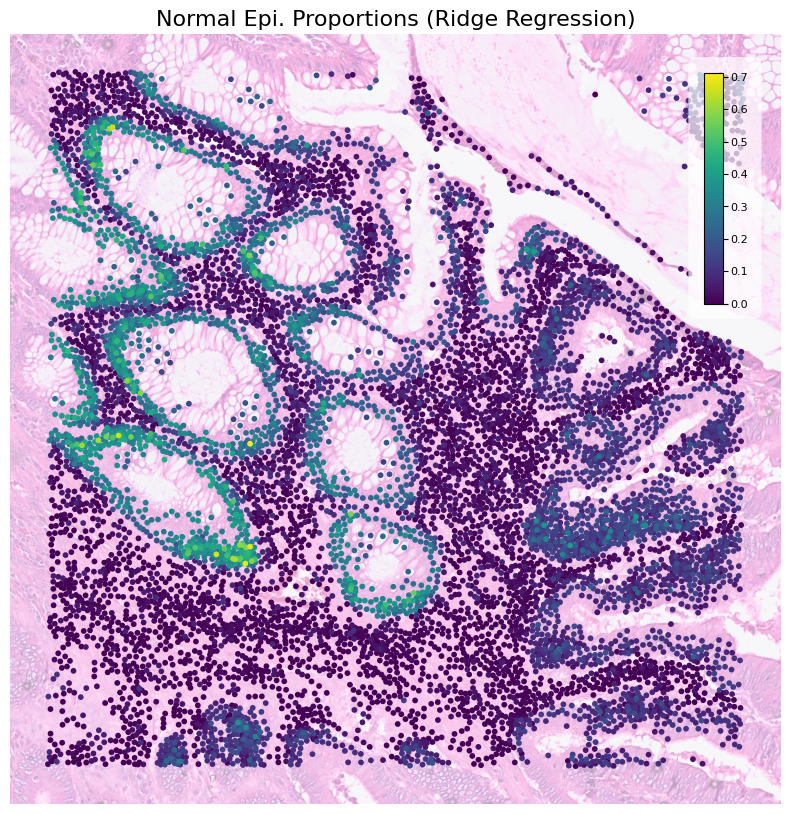

In [30]:
fig, ax = plt.subplots(figsize=(10, 10))  # Adjust figure size as needed

sc.pl.spatial(bdata, color=["Cluster 5-Healthy_epi"
                            ], img_key="0.5_mpp", basis="spatial_cropped",ax=ax,show=False,na_in_legend=False,colorbar_loc=None,alpha_img=0.4)


ax.set_title('Normal Epi. Proportions (Ridge Regression)', fontsize=16)
scatter_plot = ax.collections[0]

# Explicitly define the position of the colorbar in axes coordinates
cbar_bbox = (0.90, 0.65, 0.025, 0.3)  # (x0, y0, width, height)

# Add a white rectangle behind the colorbar (manual background)
bg_rect = patches.FancyBboxPatch(
    (cbar_bbox[0] - 0.01, cbar_bbox[1] - 0.01),  # slight padding
    cbar_bbox[2] + 0.05,
    cbar_bbox[3] + 0.02,
    transform=ax.transAxes,
    boxstyle="round,pad=0.01",
    linewidth=0,
    facecolor=[1, 1, 1, 0.7],
    zorder=2
)
ax.add_patch(bg_rect)

# Add colorbar explicitly
cax = inset_axes(
    ax,
    width="100%",
    height="100%",
    bbox_to_anchor=cbar_bbox,
    bbox_transform=ax.transAxes,
    loc='lower left',
    borderpad=0
)

cbar = plt.colorbar(scatter_plot, cax=cax)

# Force ticks inside
cbar.ax.tick_params(labelcolor='black', pad=2,labelsize=8)


ax.axis('off')

plt.savefig(f"{sample_id}_healty_epi_proportions_ridge.pdf", dpi=300)
plt.show()

In [27]:
df_cluster_proportions_ridge=get_proportions_on_tissue(bdata,markers_df=markers_df_top60lf,method="elastic",normalization_method="unit",alpha=0)

common_group_name not found, processing all spots.
Running deconvolution with parallel processing...
Normalization method: unit
Number of threads used: 5
Running deconvolution with method='elastic', alpha=0...


100%|██████████| 9167/9167 [00:03<00:00, 2962.75it/s]


Adding results to table.obs of sdata object
Deconvolution completed.


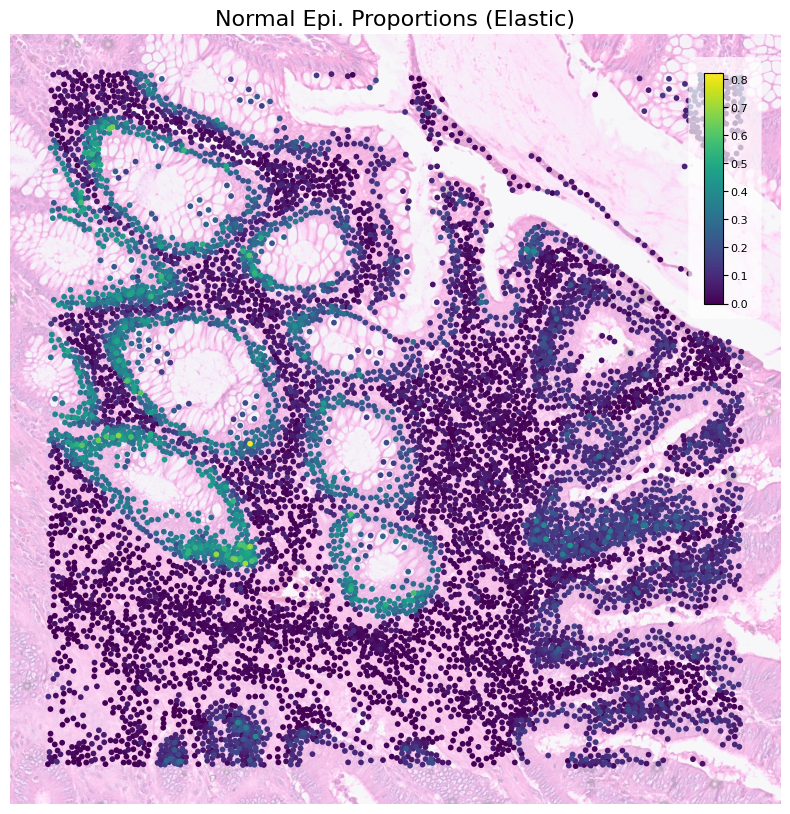

In [28]:
fig, ax = plt.subplots(figsize=(10, 10))  # Adjust figure size as needed

sc.pl.spatial(bdata, color=["Cluster 5-Healthy_epi"
                            ], img_key="0.5_mpp", basis="spatial_cropped",ax=ax,show=False,na_in_legend=False,colorbar_loc=None,alpha_img=0.4)


ax.set_title('Normal Epi. Proportions (Elastic)', fontsize=16)
scatter_plot = ax.collections[0]

# Explicitly define the position of the colorbar in axes coordinates
cbar_bbox = (0.90, 0.65, 0.025, 0.3)  # (x0, y0, width, height)

# Add a white rectangle behind the colorbar (manual background)
bg_rect = patches.FancyBboxPatch(
    (cbar_bbox[0] - 0.01, cbar_bbox[1] - 0.01),  # slight padding
    cbar_bbox[2] + 0.05,
    cbar_bbox[3] + 0.02,
    transform=ax.transAxes,
    boxstyle="round,pad=0.01",
    linewidth=0,
    facecolor=[1, 1, 1, 0.7],
    zorder=2
)
ax.add_patch(bg_rect)

# Add colorbar explicitly
cax = inset_axes(
    ax,
    width="100%",
    height="100%",
    bbox_to_anchor=cbar_bbox,
    bbox_transform=ax.transAxes,
    loc='lower left',
    borderpad=0
)

cbar = plt.colorbar(scatter_plot, cax=cax)

# Force ticks inside
cbar.ax.tick_params(labelcolor='black', pad=2,labelsize=8)


ax.axis('off')

plt.savefig(f"{sample_id}_healty_epi_proportions_elastic.pdf", dpi=300)
plt.show()